In [1]:
import pandas as pd
import numpy as np
import xmltodict as x2d
from pathlib import Path
import json
import pytesseract as ptr
import cv2 as cv
from PIL import Image, ImageChops
from difflib import SequenceMatcher
from matplotlib import pyplot as plt
import imutils
from io import BytesIO
# from deskew import determine_skew
# from alyn import Deskew
from skimage.transform import rotate
import math
from collections import deque

## What are the typical sizes/dimensions of these bounding boxes?

**We will examine the width/height ratios and the pixel volumes of the bounding boxes of the provided photos of individual vehicles.**

In [2]:
def show_bboxstats(whratios, boxvols):
    """
    Present the mean, standard deviation, and histograms of bbox sizes.
    
    parameters:
    whratios (list of float): The w:h ratios of the bboxes
    boxvols (list of int): The pixel volumes of the bboxes
    """
    whratiomean = np.mean(whratios)
    whratiostd = np.std(whratios)
    boxvolmean = np.mean(boxvols)
    boxvolstd = np.std(boxvols)
    
    plt.hist(whratios, bins=50, color='skyblue', edgecolor='black')

    # Adding labels and title
    plt.xlabel('width/height ratios')
    plt.ylabel('# occurences')
    plt.title('w/h ratio histogram')

    # Display the plot
    plt.show()
    
    print('mean w/h ratio: {}, std w/h ratio: {}\n\n'.\
          format(whratiomean, whratiostd))
    
    plt.hist(boxvols, bins=50, color='orange', edgecolor='black')

    # Adding labels and title
    plt.xlabel('bbox pixel volume')
    plt.ylabel('# occurences')
    plt.title('bbox volume histogram')

    # Display the plot
    plt.show()
    
    print('mean bbox vol: {}, std bbox vol: {}'.\
          format(boxvolmean, boxvolstd))

In [3]:
def get_bboxstats(cocopthstr):
    """
    Crop the license plate out of a vehicle image and get the plate number.
    
    parameters:
    cocopthstr (str): The path to the COCO json file
    """
    cocopth = Path(cocopthstr)
    with open(cocopth) as jsonfile:
        cocodat = json.load(jsonfile)

    whratios = []
    boxvols = []
    for annotation in cocodat['annotations']:
        width = annotation['bbox'][2]
        height = annotation['bbox'][3]
        whratio = width/height
        boxvol = width * height
        
        whratios.append(whratio)
        boxvols.append(boxvol)
        
    return whratios, boxvols


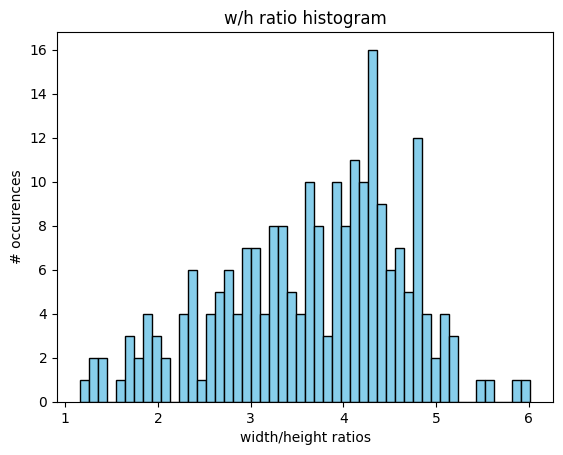

mean w/h ratio: 3.6667990161981874, std w/h ratio: 0.9774558692986262




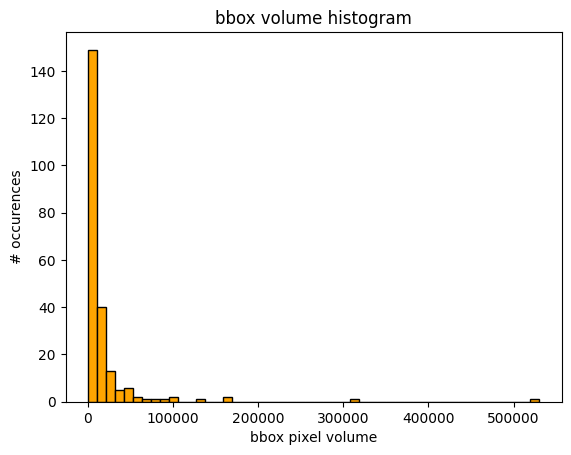

mean bbox vol: 18571.68, std bbox vol: 45633.43876992738


In [4]:
whratios, boxvols = get_bboxstats('../COCO_YOLO_dat/COCO_annot.json')
show_bboxstats(whratios, boxvols)

**We see a width/height ratio of roughly 11/1, and a typical pixel volume of roughly 18500.  Typical box dimensions would then be roughly 453x41.**

**It seems then that we would want to minimize image downsizing, due to the relatively few pixels that the OCR model will infer from.**

**Further, a manual review of some images revealed tilted plates, which are not read well by OCR models.  We would also want to keep plates horizontally aligned.**

## What are the typical locations of these boxes relative to the image space?

**We will extract the video data and examine an image.**

In [5]:
def cap_vid(lr, tb, vidpthstr, doslice=False):
    """
    Extract frames at a rate of 4 per second, and get both the...
    full frame and slices from the frame.
    
    parameters:
    lr (list of list of int): The far left and far right pixel positions to slice
    tb (list of list of int): The top and bottom pixel positions to slice
    vidpthstr (str): The path to the video file
    
    returns:
    fullarr (numpy array): The selected full frames
    """
    vidpth = Path(vidpthstr)
    vid = cv.VideoCapture(vidpthstr, apiPreference=cv.CAP_FFMPEG) 
    fps = vid.get(cv.CAP_PROP_FPS)
    frate = 4
    fint = fps / frate  # the frame skip rate
    
    ret = True
    frames = deque()
    fnum = 0
    while ret:
        ret, img = vid.read()
        if ret and fnum % fint == 0:
            # slice from each selected frame
            if doslice == True:
                frame = img[tb[0]:tb[1], lr[0]:lr[1], :]
                frames.append(frame)
            else:
                frame = img[:, :, :]  # grab the full frame
                frames.append(frame)
        fnum += 1
        
    fullarr = np.stack(frames, axis = 0)
    
    return fullarr


In [6]:
tb = [880, 2160]
lr = [640, 3200]
fullarr = cap_vid(lr, tb, '../video/LicensePlateReaderSample_4K-1.mov', False)


In [7]:
print(fullarr.shape)

(240, 2160, 3840, 3)


In [8]:
def examimg(imgarr):
    img = Image.fromarray(imgarr, 'RGB')
    img.show()

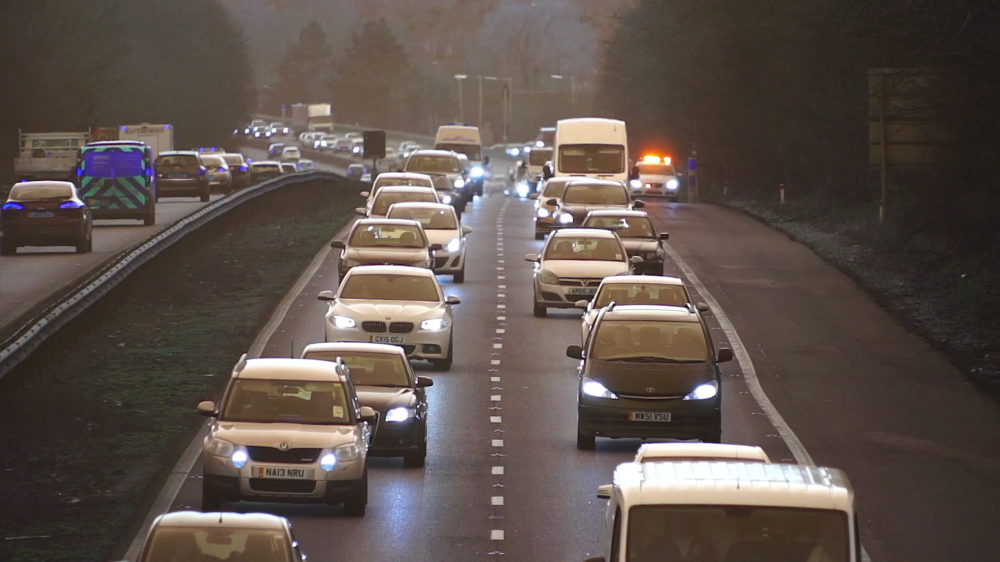

In [9]:
examimg(fullarr[0, :, :, :])

**The opposing lane does not contain the plates we are interested in.  The median and shoulder also do not contain traffic we are interested in (although traffic law enforcement may have have a requirement regarding those who drive in medians/shoulders).  The upper portion of the image is either too far out of range for meaningful plate detection or simply does not contain plates at all.**

**We will slice the image down to capture our region of interest:**

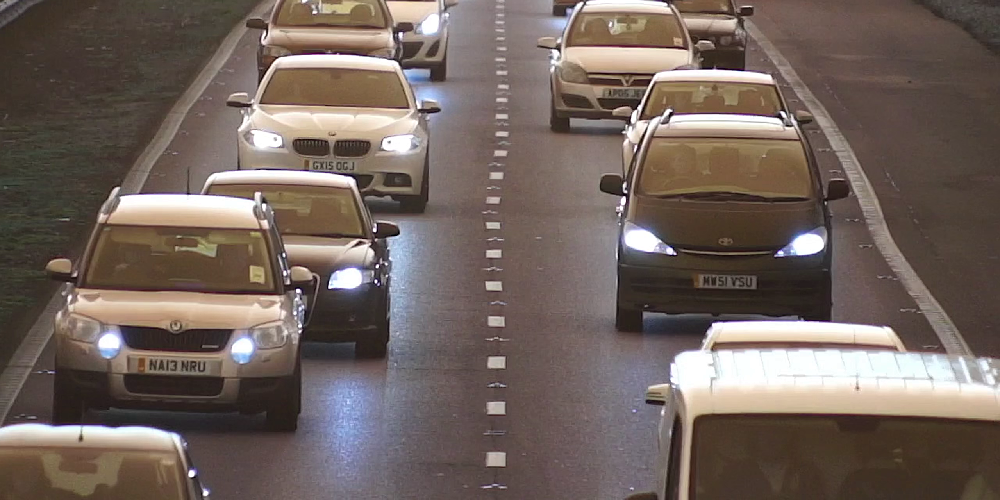

In [10]:
examimg(fullarr[0, 880:2160, 640:3200, :])

**Taken from the same frame, this slice contains our region of interest.  It is also dimensionally compatible with YoloV3.  We should preprocess images to have this size.**

## Are there attributes of images within the bounding box that impact OCR?

**A manual inspection of some images shows plates with color inversions (dark background, light text), and skewed plates.**  

**We will both examine samples of these images, and the impact of color re-inversion (to a light background and dark text) and de-skewing.**  

**First some helper functions to conduct deskewing:**

In [11]:
def getSkewAngle(src_img):
    """
    Get the skew correction angle for an image of skewed text.
    
    source:
    https://gist.github.com/zabir-nabil/dfb78f584947ebdb9f29d39c9737b5c6
    
    parameters:
    src_img (PIL Image): The image of skewed text
    
    returns:
    corang (float): The degrees to correcct skewing
    """
    src_img = np.array(src_img)

    if len(src_img.shape) == 3:
        h, w, _ = src_img.shape
    elif len(src_img.shape) == 2:
        h, w = src_img.shape
    else:
        print('upsupported image type')

    img = cv.medianBlur(src_img, 3)

    edges = cv.Canny(img,  threshold1 = 30,  threshold2 = 100, apertureSize = 3, L2gradient = True)
    lines = cv.HoughLinesP(edges, 1, np.pi/180, 30, minLineLength=w / 4.0, maxLineGap=h/4.0)
    angle = 0.0
    nlines = lines.size

    cnt = 0
    for x1, y1, x2, y2 in lines[0]:
        ang = np.arctan2(y2 - y1, x2 - x1)
        if np.abs(ang) <= 30: # excluding extreme rotations
            angle += ang
            cnt += 1

    if cnt == 0:
        skewang = 0
    else:
        skewang = (angle / cnt)*180/np.pi

    return skewang
    

In [12]:
def rotate_image(image, angle):
    """
    Rotate an image
    
    source:
    https://gist.github.com/zabir-nabil/dfb78f584947ebdb9f29d39c9737b5c6
    
    parameters:
    image (PIL Image): The image of text to be rotated
    angle (float): The degrees to rotate the image
    
    returns:
    result (PIL Image): The rotated image
    """
    image = np.array(image)
    image_center = tuple(np.array(image.shape[1::-1]) / 2)
    rot_mat = cv.getRotationMatrix2D(image_center, angle, 1.0)
    result = cv.warpAffine(image, rot_mat, image.shape[1::-1], flags=cv.INTER_LINEAR)
    result = Image.fromarray(result)
    
    return result

**Now a main function which grayscales, crops, calls deskewing, and inverts colors prior to OCR:**

In [13]:
def get_plates(cocopthstr, imid, colmod='color', rotcor=False, colcor=False, striplo=False):
    """
    Crop the license plate out of a vehicle image and get the plate number.
    
    parameters:
    cocopthstr (str): The path to the COCO json file
    imid (str): The image ID
    colmod (str): The image color mode ('gray' or 'color')
    rotcor (bool): Whether to apply deskewing or not
    colcor (bool): Whether to apply color inversion or not
    striplo (bool): Whether to stip lowercase characters or not
    """
    cocopth = Path(cocopthstr)
    with open(cocopth) as jsonfile:
        cocodat = json.load(jsonfile)

    for annotation in cocodat['annotations']:
        if annotation['image_id'] == imid:
            if colmod == 'gray':
                image = Image.open('../images/{}.jpeg'.format(annotation['image_id'])).\
                        convert('L')
            elif colmod == 'color':
                image = Image.open('../images/{}.jpeg'.format(annotation['image_id']))
            left = annotation['bbox'][0]
            up = annotation['bbox'][1]
            right = annotation['bbox'][0] + annotation['bbox'][2]
            bottom = annotation['bbox'][1] + annotation['bbox'][3]
            cropim = image.crop((left, up, right, bottom))
            cropim.show()
            
            if rotcor:  # deskew
                angle = getSkewAngle(cropim)
                cropim = rotate_image(cropim, angle)
            if colcor:  # invert colors
                cropim = ImageChops.invert(cropim)
            
            plate = ptr.image_to_string(cropim).replace(' ', '')
            plate = ''.join(filter(str.isalnum, plate))
            if striplo:
                plate = plate.translate(table)

            image.show()
            cropim.show()
            print('image id: {}'.format(annotation['image_id']))
            print('detected plate number: {}'.format(plate))

**We will first examine a case of color inversion:**

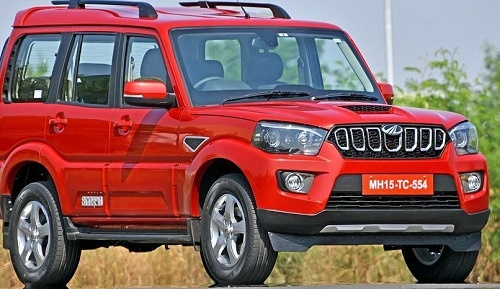

image id: N105
detected plate number: 


In [14]:
get_plates('../COCO_YOLO_dat/COCO_annot.json', 'N105', 'color', False, False)

**We see the darker plate background with lighter text is not recognized by OCR.**  

**We will now apply grayscaling with color re-inversion:**

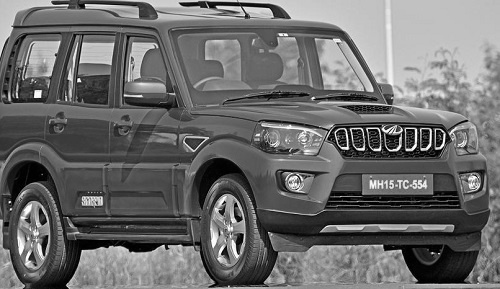

image id: N105
detected plate number: MHI5TC554


In [15]:
get_plates('../COCO_YOLO_dat/COCO_annot.json', 'N105', 'gray', False, True)

**We see that while not perfect, OCR is more successful after grayscaling and color re-inversion.**  

**Now we will examine a case of image skewing:**

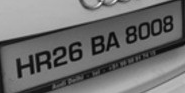

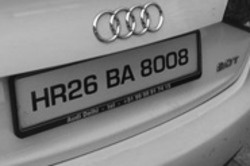

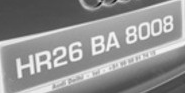

image id: N114
detected plate number: 


In [16]:
get_plates('../COCO_YOLO_dat/COCO_annot.json', 'N114', 'gray', False, True)

**The image skew is noticeable, and we see OCR does not read any characters correctly.**  

**Now we will apply image deskewing:**

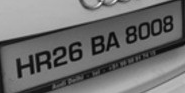

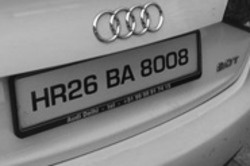

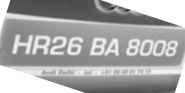

image id: N114
detected plate number: HR26BA8008


In [17]:
get_plates('../COCO_YOLO_dat/COCO_annot.json', 'N114', 'gray', True, True)

**We see that OCR is perfect with this deskewed image.**

**Since this data is the output of the first of two models, there should be grayscaling, deskewing, and color inversion capability between the two models.**

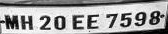

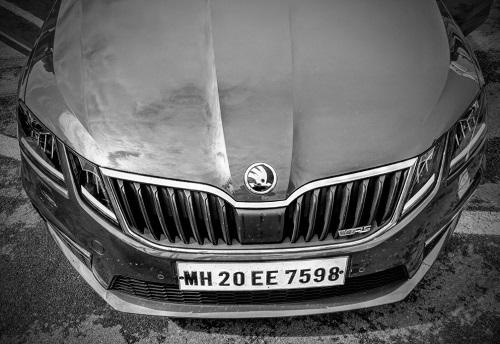

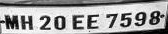

image id: N112
detected plate number: enaeeMH20EE7598


In [18]:
get_plates('../COCO_YOLO_dat/COCO_annot.json', 'N112', 'gray', True, False)

**There are also some images which yield extraneous lowercase characters.  The model should have the ability to strip these extraneous characters.**

## Summary

**The preprocessing pipeline will slice images down spatially (vertically 880:2160, horizontally 640:3200) and reduce feed rate (according to the results of *model_performance.ipynb*.**

**Between the Yolo and Tesseract-OCR models, there could be some capability for grayscaling, color inversion, deskewing, and extraneous character stripping.  This capability will be determined in *model_performance.ipynb*.**